# Selected 'Statistical Rethinking' examples using CmdStanPy

This notebook attempts to reproduce the analysis for some of the examples covered throughout the book 'Statistical Rethinking' 2nd Ed. by Richard McElreath using CmdStanPy. 

Statistical Rethinking site: https://xcelab.net/rm/statistical-rethinking/

See also:
- https://mc-stan.org/docs/2_26/stan-users-guide/index.html
- https://vincentarelbundock.github.io/rethinking2/
- https://bebi103b.github.io/index.html
   - in particular: 
      - https://bebi103b.github.io/lessons/13/prior_predictive_checks.html
      - https://bebi103b.github.io/lessons/14/posterior_predictive_checks.html

## Setup

**cmdstanpy:** I had a bit of trouble at first getting the cmdstanpy model compiler to work on my mac. But I found the following steps worked, which involved setting the compiler flag to clang.

**arviz:** ArViz is a package for working with the data generated by stan. It includes useful diagnostic plotting functions.

**altair:** Altair is a plotting package that I've grown fond of. It feels more intuitive and elegant than matplotlib.

In [ ]:
# I had to do the following to get the model to compile...a one-time thing.
# os.environ["CXX"] = "clang++" # always needed
# cmdstanpy.install_cmdstan()
# cmdstanpy.cmdstan_path()

In [1]:
import os
os.environ["CXX"] = "clang++"

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import altair as alt
alt.data_transformers.disable_max_rows()
alt.renderers.enable('jupyterlab')

import arviz as az

from scipy import stats
from sklearn.linear_model import LinearRegression

import cmdstanpy

## Chapter 4.3: Gaussian Model of Height

### Data

In [2]:
# this is the dataset used in Ch. 4 of Statistical Rethinking.
data_df = pd.read_csv('https://raw.githubusercontent.com/rmcelreath/rethinking/master/data/Howell1.csv', sep=';')
data_df = data_df[data_df.age>=18] # select adults
heights = data_df.height.values

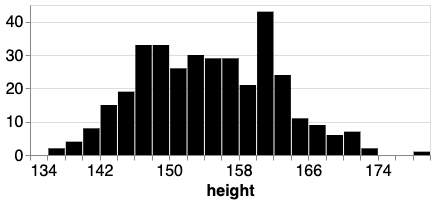

In [3]:
alt.Chart(data_df).mark_bar(color='black').encode(
    alt.X('height', bin=alt.Bin(maxbins=30, extent=[135, 180]),
            title='height'),
    alt.Y('count()', title=None),
).properties(
    width=400,
    height=150
).configure_axis(
        labelFontSize=16,
        titleFontSize=16
)

### Prior predictive checks

CmdStanPy reads the model code from a file on disk, so we first define it, then save it as a file.

In [4]:
model_file = "./stan_artifacts/model_height_prior_check.stan"

For the prior predictive check, we're not working with actual observed data, but simply simulating from the likelihood and prior. But we still pass in a data block that encodes the parameters.

The generated quantities block is for drawing samples from distributions. We could do this step -- the prior predictive check -- using other tools like scipy, but I prefer doing all of the modeling steps under the unified umbrella of stan.

In the following, we're telling stan to generate N_ppc samples for height, for each draw of mu and sigma. Taking N_ppc=100, that means 100 * 1000 distinct values (iter_sampling=1000 in the sample method call below).

**NOTE:** For sigma, I'm using a broad lognormal distribution rather than a uniform dist (which is used in the text). The uniform works for most of the steps below, but I found for the MLE optimization, it had trouble converging on the MLE sigma starting with a uniform prior, whereas the smooth lognormal prior behaved better.

In [5]:
model_code = """
data {
  int<lower=1> N_ppc;
  real mu_loc;
  real mu_scale;
  real sigma_loc;
  real sigma_scale;
}

generated quantities {
  real mu;
  real<lower=0> sigma;
  real height[N_ppc];
  
  mu = normal_rng(mu_loc, mu_scale);
  sigma = lognormal_rng(sigma_loc, sigma_scale);
  
  for (i in 1:N_ppc) {
    height[i] = normal_rng(mu, sigma);
  }
}
"""
with open(model_file, "w") as f:
    print(model_code, file=f)

In [6]:
stan_model = cmdstanpy.CmdStanModel(stan_file=model_file)
stan_model.compile()

INFO:cmdstanpy:compiling stan program, exe file: /Users/jamieinfinity/Dropbox/Projects/twimlai/prob_prog/bayesian/stan_artifacts/model_height_prior_check
INFO:cmdstanpy:compiler options: stanc_options=None, cpp_options=None
INFO:cmdstanpy:compiled model file: /Users/jamieinfinity/Dropbox/Projects/twimlai/prob_prog/bayesian/stan_artifacts/model_height_prior_check
INFO:cmdstanpy:found newer exe file, not recompiling
INFO:cmdstanpy:compiled model file: /Users/jamieinfinity/Dropbox/Projects/twimlai/prob_prog/bayesian/stan_artifacts/model_height_prior_check


In [7]:
data = {
    'N_ppc':100,
    'mu_loc':178,
    'mu_scale':20,
    'sigma_loc':1,
    'sigma_scale':1
}

In [8]:
fit_prior = stan_model.sample(data=data, iter_sampling=1000, fixed_param=True) # NOTE: these aren't needed for the ppc: chains=1, iter_warmup=0)

INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1


In [9]:
azdata = az.from_cmdstanpy(
    prior=fit_prior, 
    prior_predictive=['height']
)
samp_priors_df = azdata.prior.to_dataframe().reset_index()
samp_prior_pred_df = azdata.prior_predictive.to_dataframe().reset_index()

In [10]:
az.summary(azdata)

arviz - WARNING - Shape validation failed: input_shape: (1, 1000), minimum_shape: (chains=2, draws=4)


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
mu,177.099,19.623,142.599,214.04,0.647,0.458,919.0,919.0,913.0,1024.0,NaN
sigma,4.649,5.524,0.100,12.71,0.175,0.124,991.0,991.0,980.0,932.0,NaN


In [11]:
# there are 1000 draws of (mu, sigma)
print(samp_priors_df.shape)
samp_priors_df.head()

(1000, 4)


,chain,draw,mu,sigma
0,0,0,215.141,2.28007
1,0,1,220.170,4.74710
2,0,2,191.976,5.25364
3,0,3,199.004,1.09649
4,0,4,194.937,4.20454


In [12]:
# there are 100,000 distinct values for height (100 for each draw of mu,sigma)
print(samp_prior_pred_df.shape)
samp_prior_pred_df.head()

(100000, 4)


,chain,draw,height_dim_0,height
0,0,0,0,209.711
1,0,0,1,217.947
2,0,0,2,215.762
3,0,0,3,213.909
4,0,0,4,215.123


In [ ]:
w=400
h=200

chart_mu = alt.Chart(samp_priors_df).mark_bar(color='black').encode(
    alt.X('mu', bin=alt.Bin(maxbins=30), title='mu'),
    alt.Y('count()', title=None),
).properties(
    width=w,
    height=h
)

chart_sigma = alt.Chart(samp_priors_df).mark_bar(color='black').encode(
    alt.X('sigma', bin=alt.Bin(maxbins=30), title='sigma'),
    alt.Y('count()', title=None),
).properties(
    width=w,
    height=h
)

chart_height = alt.Chart(samp_prior_pred_df).mark_bar(color='black').encode(
    alt.X('height', bin=alt.Bin(maxbins=50), title='height'),
    alt.Y('count()', title=None),
).properties(
    width=w,
    height=h
)

alt.vconcat(chart_mu, chart_sigma, chart_height).configure_axis(
    labelFontSize=16,
    titleFontSize=16
)

### Fitting the posterior

In [14]:
model_file = "./stan_artifacts/model_height.stan"

In [15]:
model_code = """
data {
  int<lower=1> N_obs;
  int<lower=1> N_ppc;
  real height[N_obs];
}
parameters {
  real mu;
  real<lower=0> sigma;
}
model {
  mu ~ normal(178, 20);
  sigma ~ lognormal(1, 1);
  height ~ normal(mu, sigma);
}
generated quantities {
  real height_ppc[N_ppc];  
  for (i in 1:N_ppc) {
    height_ppc[i] = normal_rng(mu, sigma);
  }
}
"""
with open(model_file, "w") as f:
    print(model_code, file=f)

In [16]:
data = {
    'N_obs':len(heights),
    'N_ppc':100,
    'height':heights
}

In [17]:
stan_model = cmdstanpy.CmdStanModel(stan_file=model_file)
stan_model.compile()

INFO:cmdstanpy:compiling stan program, exe file: /Users/jamieinfinity/Dropbox/Projects/twimlai/prob_prog/bayesian/stan_artifacts/model_height
INFO:cmdstanpy:compiler options: stanc_options=None, cpp_options=None
INFO:cmdstanpy:compiled model file: /Users/jamieinfinity/Dropbox/Projects/twimlai/prob_prog/bayesian/stan_artifacts/model_height
INFO:cmdstanpy:found newer exe file, not recompiling
INFO:cmdstanpy:compiled model file: /Users/jamieinfinity/Dropbox/Projects/twimlai/prob_prog/bayesian/stan_artifacts/model_height


In [18]:
fit = stan_model.sample(data=data, iter_sampling=1000, iter_warmup=1000, chains=4)

INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:start chain 2
INFO:cmdstanpy:start chain 3
INFO:cmdstanpy:start chain 4
INFO:cmdstanpy:finish chain 1
INFO:cmdstanpy:finish chain 4
INFO:cmdstanpy:finish chain 2
INFO:cmdstanpy:finish chain 3


In [19]:
azdata = az.from_cmdstanpy(
    posterior=fit, 
    posterior_predictive=['height_ppc'],
    observed_data={"height": data["height"]}
)
samp_post_df = azdata.posterior.to_dataframe().reset_index()
samp_post_pred_df = azdata.posterior_predictive.to_dataframe().reset_index()

In [20]:
az.summary(azdata)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
mu,154.611,0.413,153.865,155.432,0.007,0.005,3356.0,3356.0,3369.0,2610.0,1.0
sigma,7.750,0.293,7.234,8.313,0.005,0.004,3328.0,3301.0,3365.0,2499.0,1.0


In [21]:
# there are 4*1000 draws of mu, sigma
print(samp_post_df.shape)
samp_post_df.head()

(4000, 4)


,chain,draw,mu,sigma
0,0,0,154.722,7.79339
1,0,1,154.344,7.94829
2,0,2,154.843,7.51896
3,0,3,154.310,7.97369
4,0,4,154.445,7.66267


In [22]:
# there are 4*1000*100 sampled values of height
print(samp_post_pred_df.shape)
samp_post_pred_df.head()

(400000, 4)


,chain,draw,height_ppc_dim_0,height_ppc
0,0,0,0,152.185
1,0,0,1,146.102
2,0,0,2,151.921
3,0,0,3,151.260
4,0,0,4,150.949


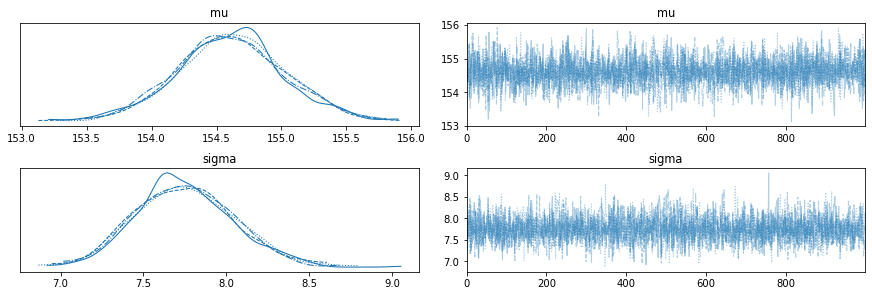

In [23]:
az.plot_trace(azdata)

plt.show()

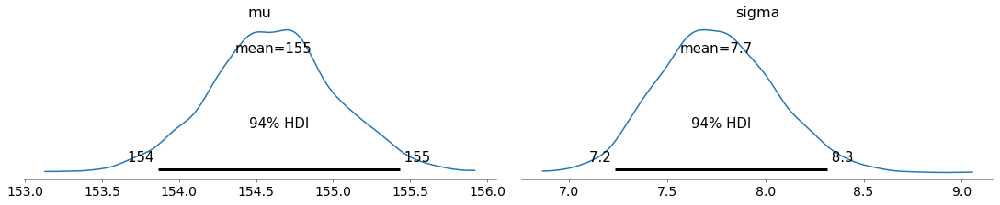

In [24]:
az.plot_posterior(azdata, figsize=[15, 3])

plt.show()

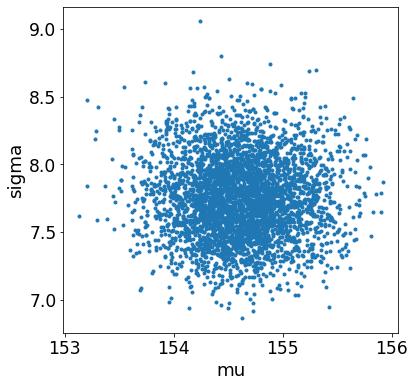

In [25]:
az.plot_pair(azdata, var_names=['mu', 'sigma'], kind='scatter', figsize=(6, 6))

plt.show()

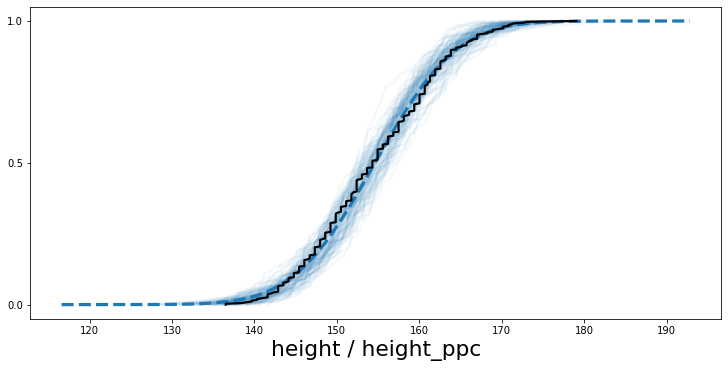

In [26]:
az.plot_ppc(azdata, kind='cumulative', data_pairs={'height':'height_ppc'}, alpha=0.05, figsize=(10, 5), legend=False, num_pp_samples=100)

plt.show()

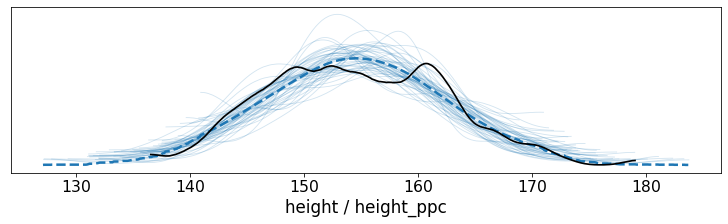

In [27]:
az.plot_ppc(azdata, data_pairs={'height':'height_ppc'}, alpha=0.2, figsize=(10, 3), legend=False, num_pp_samples=50)

plt.show()

## Chapter 4.4: Linear Prediction

### Data

In [28]:
# this is the dataset used in Ch. 4 of Statistical Rethinking.
data_df = pd.read_csv('https://raw.githubusercontent.com/rmcelreath/rethinking/master/data/Howell1.csv', sep=';')
data_df = data_df[data_df.age>=18] # select adults
heights = data_df.height.values
weights = data_df.weight.values

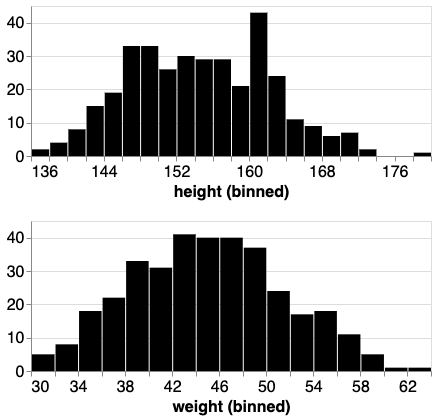

In [29]:
h=alt.Chart(data_df).mark_bar(color='black').encode(
    alt.X('height', bin=alt.Bin(maxbins=30)),
    alt.Y('count()', title=None),
).properties(
    width=400,
    height=150
)

w=alt.Chart(data_df).mark_bar(color='black').encode(
    alt.X('weight', bin=alt.Bin(maxbins=30)),
    alt.Y('count()', title=None),
).properties(
    width=400,
    height=150
)
    
alt.vconcat(h, w).configure_axis(
        labelFontSize=16,
        titleFontSize=16
)

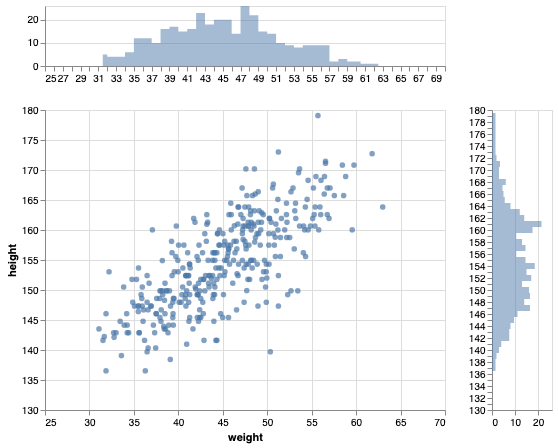

In [30]:
base = alt.Chart(data_df)

xscale = alt.Scale(domain=(25, 70))
yscale = alt.Scale(domain=(130, 180))

area_args = {'opacity': .5, 'interpolate': 'step'}

points = base.mark_circle().encode(
    alt.X('weight', scale=xscale),
    alt.Y('height', scale=yscale)
)

top_hist = base.mark_area(**area_args).encode(
    alt.X('weight:Q',
          bin=alt.Bin(maxbins=50, extent=xscale.domain),
          stack=None,
          title=''
         ),
    alt.Y('count()', stack=None, title='')
).properties(height=60)

right_hist = base.mark_area(**area_args).encode(
    alt.Y('height:Q',
          bin=alt.Bin(maxbins=50, extent=yscale.domain),
          stack=None,
          title='',
         ),
    alt.X('count()', stack=None, title='')
).properties(width=60)

top_hist & (points | right_hist)

### Prior predictive checks

In [31]:
model_file = "./stan_artifacts/model_ht_wt_prior_check.stan"

For our prior predictive check, we pass in a set of linearly spaced weights that span the expected range of values. We have to do this since we don't have the observed data at this stage in the model building. An alternative would be to sample weight from a gaussian (with an appropriate choice of mean and variance), which could be encoded in stan as well.

In [32]:
w_mean = data_df.weight.mean()
w_std = data_df.weight.std()
w_ppc = list(range(30, 72, 2))

(round(w_mean, 2), round(w_std, 2))

(44.99, 6.46)

Note that we are shifting weight by the mean value, as is done in 'Statistical Rethinking', i.e.

mu = a + b*(w - w_loc)

In [33]:
model_code = """
data {
  int<lower=1> Nw_ppc; // number of weight values
  int<lower=1> Nh_ppc; // number of height values to sample
  vector[Nw_ppc] w;
  real w_loc;
  real w_scale;
  real a_loc;
  real a_scale;
  real b_loc;
  real b_scale;
  real sigma_loc;
  real sigma_scale;
}

generated quantities {
  real a;
  real<lower=0> b;
  real<lower=0,upper=50> sigma;
  real height[Nh_ppc, Nw_ppc];
  
  a = normal_rng(a_loc, a_scale);
  b = lognormal_rng(b_loc, b_scale);
  sigma = lognormal_rng(sigma_loc, sigma_scale);
  
  for (i in 1:Nh_ppc) {
    height[i] = normal_rng(a + b*(w - w_loc), sigma);
  }  
}
"""
with open(model_file, "w") as f:
    print(model_code, file=f)

In [34]:
stan_model = cmdstanpy.CmdStanModel(stan_file=model_file)
stan_model.compile()

INFO:cmdstanpy:compiling stan program, exe file: /Users/jamieinfinity/Dropbox/Projects/twimlai/prob_prog/bayesian/stan_artifacts/model_ht_wt_prior_check
INFO:cmdstanpy:compiler options: stanc_options=None, cpp_options=None
INFO:cmdstanpy:compiled model file: /Users/jamieinfinity/Dropbox/Projects/twimlai/prob_prog/bayesian/stan_artifacts/model_ht_wt_prior_check
INFO:cmdstanpy:found newer exe file, not recompiling
INFO:cmdstanpy:compiled model file: /Users/jamieinfinity/Dropbox/Projects/twimlai/prob_prog/bayesian/stan_artifacts/model_ht_wt_prior_check


In [35]:
data = {
    'Nh_ppc':50,
    'Nw_ppc':len(w_ppc),
    'w':w_ppc,
    'w_loc':w_mean,
    'w_scale':w_std,
    'a_loc':178,
    'a_scale':20,
    'b_loc':0,
    'b_scale':1,
    'sigma_loc':1,
    'sigma_scale':1
}

In [36]:
len(w_ppc)

21

In [37]:
fit_prior = stan_model.sample(data=data, iter_sampling=100, fixed_param=True) # NOTE: these aren't needed: chains=1, iter_warmup=0)

INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1


In [38]:
azdata = az.from_cmdstanpy(
    prior=fit_prior, 
    prior_predictive=['height'],
    observed_data=data
)
samp_priors_df = azdata.prior.to_dataframe().reset_index()

# for the prior predictive check, we're joining in all of the samples to have a complete
# dataset to work with
samp_prior_pred_df = azdata.prior_predictive.to_dataframe().reset_index()
temp = pd.DataFrame({'weight':w_ppc})
temp['height_dim_1'] = temp.index.values
samp_prior_pred_df = pd.merge(samp_prior_pred_df, temp, how='left', on='height_dim_1')
samp_prior_pred_df = pd.merge(samp_prior_pred_df, samp_priors_df, how='left', on=['chain', 'draw'])

In [39]:
az.summary(azdata)

arviz - WARNING - Shape validation failed: input_shape: (1, 100), minimum_shape: (chains=2, draws=4)


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
a,177.598,19.971,146.186,218.903,1.991,1.416,101.0,100.0,102.0,113.0,NaN
b,1.417,1.433,0.099,4.204,0.136,0.097,111.0,111.0,100.0,100.0,NaN
sigma,4.112,4.492,0.373,11.940,0.484,0.344,86.0,86.0,94.0,64.0,NaN


In [40]:
# there are 100 draws of a,b,sigma
print(samp_priors_df.shape)
samp_priors_df.head()

(100, 5)


,chain,draw,a,b,sigma
0,0,0,164.122,1.367180,7.735470
1,0,1,202.602,4.145140,1.045610
2,0,2,183.095,0.409293,0.873153
3,0,3,170.644,0.419152,2.083390
4,0,4,168.955,0.680413,3.398000


In [41]:
# there are 100*50*len(w_ppc) values of height
print(samp_prior_pred_df.shape)
samp_prior_pred_df.head()

(105000, 9)


,chain,draw,height_dim_0,height_dim_1,height,weight,a,b,sigma
0,0,0,0,0,139.792,30,164.122,1.36718,7.73547
1,0,0,0,1,150.469,32,164.122,1.36718,7.73547
2,0,0,0,2,143.717,34,164.122,1.36718,7.73547
3,0,0,0,3,141.708,36,164.122,1.36718,7.73547
4,0,0,0,4,153.900,38,164.122,1.36718,7.73547


We're following along with the analysis in 'Statistical Rethinking', where he does a check of the simulated lines implied by the priors for a and b. Below, we show two different approaches to inspecting these lines. 

In the first, we calculated, for each pair of a and b, and each value of weight, the mean of the height, then we plot that height vs weight as a line -- one line for each pair of a and b.

In the second (which is what is done in 'Stat. Rethinking'), we calculate the height based solely on the linear model in the prior: h = a + b(w - w_mean). These lines are perfectly strait, of course, while the lines in the first approach have variation due to sampling. 

We also plot the raw values of height to show the effect of sigma.

In [42]:
lines_df = samp_prior_pred_df.groupby(['chain', 'draw', 'height_dim_1']).mean().reset_index().rename(
    {'height':'height_mean'}, axis=1).drop(['height_dim_0'], axis=1)
lines_df['height_std'] = samp_prior_pred_df.groupby(['chain', 'draw', 'height_dim_1']).height.std().values
lines_df['height_mu'] = lines_df.a + lines_df.b*(lines_df.weight - w_mean)

In [43]:
lines_df.head()

,chain,draw,height_dim_1,height_mean,weight,a,b,sigma,height_std,height_mu
0,0,0,0,143.81476,30.0,164.122,1.36718,7.73547,7.664029,143.627308
1,0,0,1,146.79536,32.0,164.122,1.36718,7.73547,7.753175,146.361668
2,0,0,2,148.17096,34.0,164.122,1.36718,7.73547,8.032933,149.096028
3,0,0,3,150.48984,36.0,164.122,1.36718,7.73547,7.080921,151.830388
4,0,0,4,154.82090,38.0,164.122,1.36718,7.73547,6.651374,154.564748


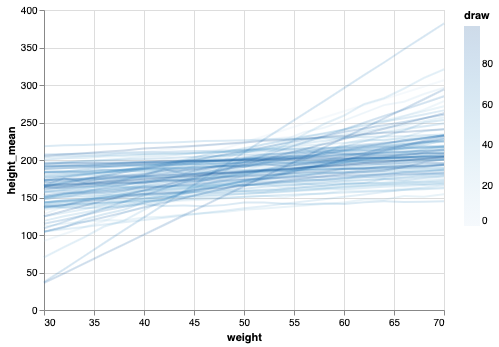

In [44]:
alt.Chart(lines_df).mark_line(opacity=0.2).encode(
    x='weight',
    y='height_mean',
    color='draw'
)

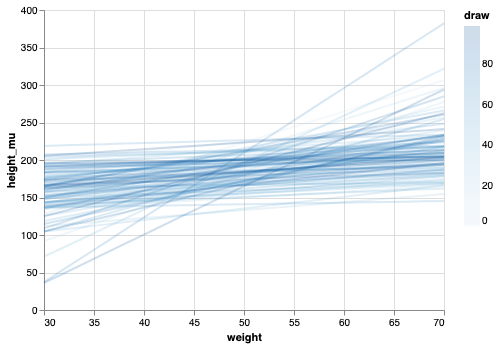

In [45]:
alt.Chart(lines_df).mark_line(opacity=0.2).encode(
    x='weight',
    y=alt.Y('height_mu'),
    color='draw'
)

In [46]:
# alt.Chart(samp_prior_pred_df).mark_circle(opacity=0.01).encode(
#     x=alt.X('weight', scale=alt.Scale(domain=[30, 70])),
#     y=alt.Y('height', scale=alt.Scale(domain=[0, 350])),
# )

Here we show the histogram of height at the value of weight = 44, which is close to the mean.

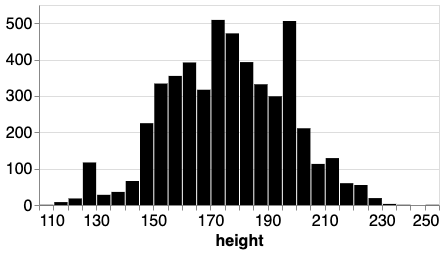

In [47]:
temp_df = samp_prior_pred_df[samp_prior_pred_df.weight==44]

chart_height = alt.Chart(temp_df).mark_bar(color='black').encode(
    alt.X('height', bin=alt.Bin(maxbins=30), title='height'),
    alt.Y('count()', title=None),
).properties(
    width=400,
    height=200
)

chart_height.configure_axis(
    labelFontSize=16,
    titleFontSize=16
)

### Fitting the posterior

#### Define the model

In [48]:
model_file = "./stan_artifacts/model_ht_wt.stan"

In [49]:
w_ppc = list(range(30, 72, 2))

In [50]:
data = {
    'N_obs':len(weights),
    'Nw_ppc':len(w_ppc),
    'Nh_ppc':50,
    'weight':weights,
    'height':heights,
    'w_ppc':w_ppc
}

In [51]:
model_code = """
data {
  int<lower=1> N_obs;
  int<lower=1> Nw_ppc;
  int<lower=1> Nh_ppc;
  vector[N_obs] height;
  vector[N_obs] weight;
  vector[Nw_ppc] w_ppc;
  
}
transformed data {
  real w_mean = mean(weight);
}
parameters {
  real a;
  real<lower=0> b;
  real<lower=0> sigma;
}
model {
  a ~ normal(178, 20);
  b ~ lognormal(0, 1);
  sigma ~ lognormal(1, 1);
  height ~ normal(a + b * (weight - w_mean), sigma);
}
generated quantities {
  real height_ppc[Nh_ppc, Nw_ppc];
  for (i in 1:Nh_ppc) {
    height_ppc[i] = normal_rng(a + b*(w_ppc - w_mean), sigma);
  }
}
"""
with open(model_file, "w") as f:
    print(model_code, file=f)

In [52]:
stan_model = cmdstanpy.CmdStanModel(stan_file=model_file)
stan_model.compile()

INFO:cmdstanpy:compiling stan program, exe file: /Users/jamieinfinity/Dropbox/Projects/twimlai/prob_prog/bayesian/stan_artifacts/model_ht_wt
INFO:cmdstanpy:compiler options: stanc_options=None, cpp_options=None
INFO:cmdstanpy:compiled model file: /Users/jamieinfinity/Dropbox/Projects/twimlai/prob_prog/bayesian/stan_artifacts/model_ht_wt
INFO:cmdstanpy:found newer exe file, not recompiling
INFO:cmdstanpy:compiled model file: /Users/jamieinfinity/Dropbox/Projects/twimlai/prob_prog/bayesian/stan_artifacts/model_ht_wt


#### MLE optimization check

In [53]:
fit_mle = stan_model.optimize(data=data)

INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1


In [54]:
fit_mle.optimized_params_pd

,lp__,a,b,sigma,"height_ppc[1,1]","height_ppc[2,1]","height_ppc[3,1]","height_ppc[4,1]","height_ppc[5,1]","height_ppc[6,1]",...,"height_ppc[41,21]","height_ppc[42,21]","height_ppc[43,21]","height_ppc[44,21]","height_ppc[45,21]","height_ppc[46,21]","height_ppc[47,21]","height_ppc[48,21]","height_ppc[49,21]","height_ppc[50,21]"
0,-751.789,154.601,0.903294,5.06021,143.81,141.888,148.789,134.592,136.177,140.104,...,183.111,179.263,176.3,176.965,178.411,177.879,179.823,180.206,183.503,188.473


Compare this with what we would have obtained via a least squares fit:

In [55]:
x = np.transpose(np.array([weights]))
x = x-np.mean(x)
y = heights
fit_lr = LinearRegression().fit(x, y)

In [56]:
(fit_lr.intercept_, fit_lr.coef_[0])

(154.5970926136364, 0.905029108626648)

In [57]:
w = np.arange(25, 71, 1)
a = fit_mle.optimized_params_dict['a']
b = fit_mle.optimized_params_dict['b']
wmean = data_df.weight.mean()
h = a + b*(w - wmean)

mle_df = pd.DataFrame({'weight':w, 'height':h})

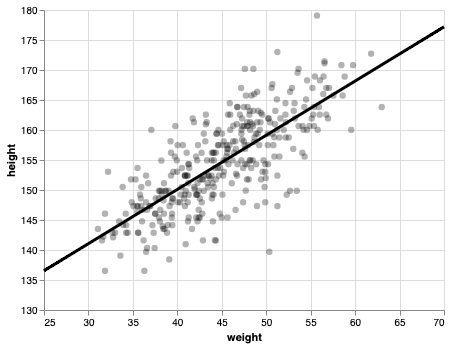

In [58]:
xscale = alt.Scale(domain=(25, 70))
yscale = alt.Scale(domain=(130, 180))

points = alt.Chart(data_df).mark_circle(size=40, opacity=0.3, color='black').encode(
    alt.X('weight', scale=xscale),
    alt.Y('height', scale=yscale)
)

line = alt.Chart(mle_df).mark_line(size=3, color='black').encode(
    alt.X('weight', scale=xscale),
    alt.Y('height', scale=yscale)
)

points + line

#### MCMC fit

In [59]:
fit = stan_model.sample(data=data, iter_sampling=500, iter_warmup=500, chains=2)

INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:start chain 2
INFO:cmdstanpy:finish chain 1
INFO:cmdstanpy:finish chain 2


In [60]:
azdata = az.from_cmdstanpy(
    posterior=fit, 
    posterior_predictive=['height_ppc'],
    observed_data={'weight': weights, 'height': heights}
)

In [61]:
az.summary(azdata)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
a,154.592,0.268,154.072,155.075,0.009,0.006,907.0,907.0,906.0,507.0,1.0
b,0.904,0.044,0.825,0.989,0.001,0.001,1121.0,1121.0,1130.0,685.0,1.0
sigma,5.091,0.185,4.755,5.423,0.006,0.004,918.0,918.0,915.0,680.0,1.0


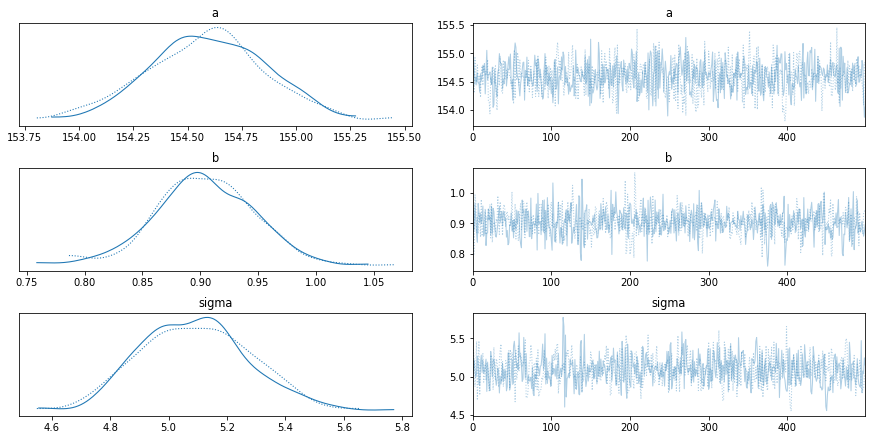

In [62]:
az.plot_trace(azdata)

plt.show()

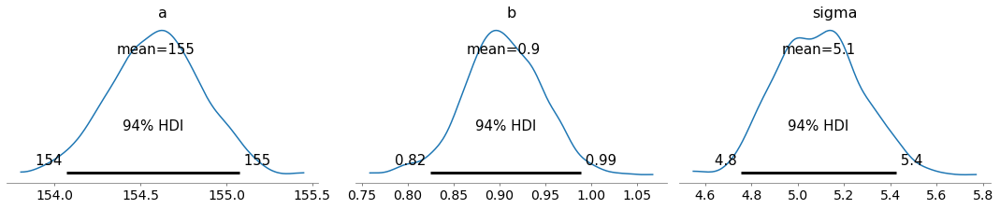

In [63]:
az.plot_posterior(azdata, figsize=[15, 3])

plt.show()

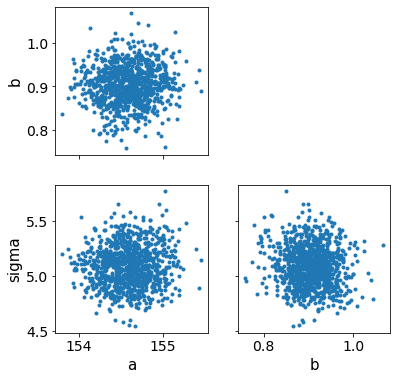

In [64]:
az.plot_pair(azdata, var_names=['a', 'b', 'sigma'], kind='scatter', figsize=(6, 6))

plt.show()

In [65]:
samp_post_df = azdata.posterior.to_dataframe().reset_index()
samp_post_pred_df = azdata.posterior_predictive.to_dataframe().reset_index()
temp = pd.DataFrame({'weight':w_ppc})
temp['height_ppc_dim_1'] = temp.index.values
samp_post_pred_df = pd.merge(samp_post_pred_df, temp, how='left', on='height_ppc_dim_1')
samp_post_pred_df = pd.merge(samp_post_pred_df, samp_post_df, how='left', on=['chain', 'draw'])

In [66]:
print(samp_post_df.shape)
samp_post_df.head()

(1000, 5)


,chain,draw,a,b,sigma
0,0,0,154.536,0.831048,4.91047
1,0,1,154.960,0.943272,5.09468
2,0,2,154.725,0.878078,5.21412
3,0,3,154.446,0.964350,5.07168
4,0,4,154.581,0.916487,4.99159


In [67]:
print(samp_post_pred_df.shape)
samp_post_pred_df.head()

(1050000, 9)


,chain,draw,height_ppc_dim_0,height_ppc_dim_1,height_ppc,weight,a,b,sigma
0,0,0,0,0,140.366,30,154.536,0.831048,4.91047
1,0,0,0,1,144.659,32,154.536,0.831048,4.91047
2,0,0,0,2,148.971,34,154.536,0.831048,4.91047
3,0,0,0,3,141.072,36,154.536,0.831048,4.91047
4,0,0,0,4,145.044,38,154.536,0.831048,4.91047


In [68]:
lines_df = samp_post_pred_df.groupby(['chain', 'draw', 'height_ppc_dim_1']).mean().reset_index().rename({'height_ppc':'height_ppc_mean'}, axis=1)
lines_df['height_ppc_std'] = samp_post_pred_df.groupby(['chain', 'draw', 'height_ppc_dim_1']).height_ppc.std().values
lines_df['height_ppc_mu'] = lines_df.a + lines_df.b*(lines_df.weight - w_mean)

In [69]:
lines_df.head()

,chain,draw,height_ppc_dim_1,height_ppc_dim_0,height_ppc_mean,weight,a,b,sigma,height_ppc_std,height_ppc_mu
0,0,0,0,24.5,141.64378,30.0,154.536,0.831048,4.91047,4.687502,142.078187
1,0,0,1,24.5,143.44544,32.0,154.536,0.831048,4.91047,4.109510,143.740283
2,0,0,2,24.5,144.87860,34.0,154.536,0.831048,4.91047,4.908874,145.402379
3,0,0,3,24.5,147.00888,36.0,154.536,0.831048,4.91047,4.722888,147.064475
4,0,0,4,24.5,149.30758,38.0,154.536,0.831048,4.91047,5.108572,148.726571


As we would expect, after calculating the posterior for a and b based on observed data, we find a much tighter spread of lines that we saw with the prior above.

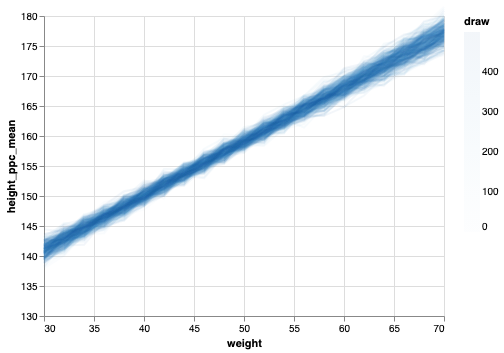

In [70]:
temp = lines_df[lines_df.chain==0]
# temp = lines_df[(lines_df.chain==0) & (lines_df.draw==2)]

alt.Chart(temp).mark_line(opacity=0.05).encode(
    x='weight',
    y=alt.Y('height_ppc_mean', scale=alt.Scale(domain=[130, 180])),
    color='draw'
)

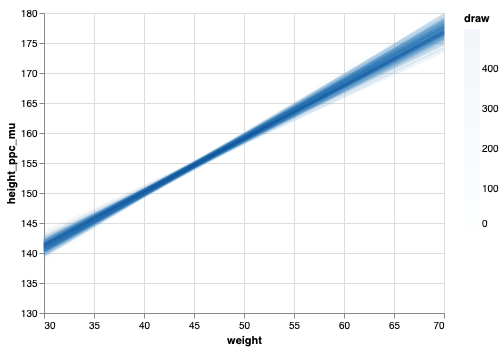

In [71]:
alt.Chart(temp).mark_line(opacity=0.05).encode(
    x='weight',
    y=alt.Y('height_ppc_mu', scale=alt.Scale(domain=[130, 180])),
    color='draw'
)

Here we show a histogram of mu values, which again has a much smaller variation than we saw above with the prior check. Note, this is not the actual predicted spread of heights that includes the effect of sigma (we show that below).

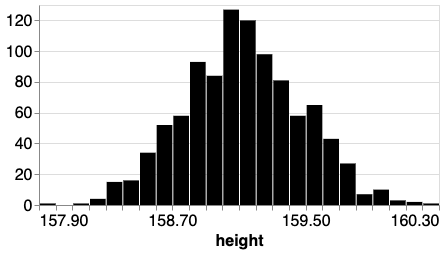

In [72]:
temp_df = lines_df[lines_df.weight==50]

chart_height = alt.Chart(temp_df).mark_bar(color='black').encode(
    alt.X('height_ppc_mu', bin=alt.Bin(maxbins=30), title='height'),
    alt.Y('count()', title=None),
).properties(
    width=400,
    height=200
)

chart_height.configure_axis(
    labelFontSize=16,
    titleFontSize=16
)

To show the full posterior predictive on height, which includes the effect of uncertainty encoded by sigma, we calculate the mean value of height for each weight, as well as the upper and lower values (using the same quantiles as in 'Statistical Rethinking' for an 89% interval). 

In [73]:
temp = samp_post_pred_df.groupby('weight').mean().reset_index()
temp['h_lower'] = samp_post_pred_df.groupby('weight').height_ppc.quantile(0.055).values
temp['h_upper'] = samp_post_pred_df.groupby('weight').height_ppc.quantile(0.945).values
temp.head()

,weight,chain,draw,height_ppc_dim_0,height_ppc_dim_1,height_ppc,a,b,sigma,h_lower,h_upper
0,30,0.5,249.5,24.5,0.0,141.030752,154.592341,0.904094,5.091289,132.88600,149.243110
1,32,0.5,249.5,24.5,1.0,142.778070,154.592341,0.904094,5.091289,134.58700,150.959000
2,34,0.5,249.5,24.5,2.0,144.635048,154.592341,0.904094,5.091289,136.42578,152.782000
3,36,0.5,249.5,24.5,3.0,146.470271,154.592341,0.904094,5.091289,138.31400,154.633110
4,38,0.5,249.5,24.5,4.0,148.218321,154.592341,0.904094,5.091289,140.09900,156.364055


This plot shows the mean value of height and the shaded region is the 89% interval.

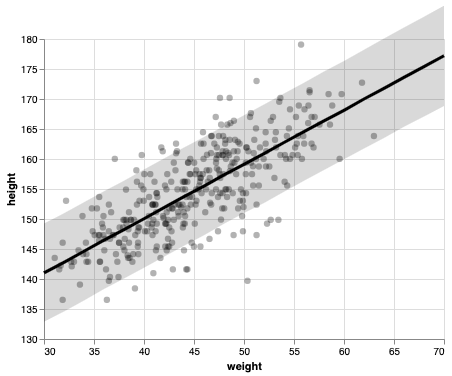

In [74]:
xscale = alt.Scale(domain=(30, 70))
yscale = alt.Scale(domain=(130, 180))

points = alt.Chart(data_df).mark_circle(size=40, opacity=0.3, color='black').encode(
    alt.X('weight', scale=xscale),
    alt.Y('height', scale=yscale, title='height')
)

line = alt.Chart(temp).mark_line(size=3, color='black').encode(
    x=alt.X('weight', scale=alt.Scale(domain=[30, 70])),
    y=alt.Y('height_ppc', scale=alt.Scale(domain=[130, 180])),
)

area = alt.Chart(temp).mark_area(opacity=0.15, color='black').encode(
    x='weight:Q',
    y='h_lower:Q',
    y2='h_upper:Q'
)

points+area+line

In [76]:
temp_df = samp_post_pred_df[samp_post_pred_df.weight==50]

chart_height = alt.Chart(temp_df).mark_bar(color='black').encode(
    alt.X('height_ppc', bin=alt.Bin(maxbins=50), title='height'),
    alt.Y('count()', title=None),
).properties(
    width=400,
    height=200
)

chart_height.configure_axis(
    labelFontSize=16,
    titleFontSize=16
)